In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

In [21]:
# Used to transform the pixle tensor from 0-255 to 0-1 (tensor) and then to -1 to 1
transform = transforms.Compose([
    transforms.ToTensor(), # transform the data set to tensor 0-1
    # Now first brackated argument is mean and second is standard deviation we are normalizing this to convert the output 
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # in the range form 0-1 to -1 to 1 which is better for training
])

In [22]:
# Loading the dataset into trainset, giving the path to download, and transforming the rgb into tensor range [-1, 1]
trainset = torchvision.datasets.CIFAR10(root='./data',train=True, download=True, transform=transform)
# training the dataset on trainset
trainloader = torch.utils.data.DataLoader(trainset,batch_size=32,shuffle=True)

In [23]:
# Similarly loading the data for testing
testset = torchvision.datasets.CIFAR10(root='./data',train=False, download=True, transform=transform)
# and running the model on testset
testloader = torch.utils.data.DataLoader(testset,batch_size=32,shuffle=False)

In [24]:
classes = ('ariplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

In [25]:
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN,self).__init__()
        # 1st argument = in_channels (R,G,B), 2nd = out_channels, 3rd = Kernal (canvas) size, padding = width of kernal
        self.conv1 = nn.Conv2d(3,16,3,padding=1) # [16, 32X32] 16 here equals to output and 32X32 is size of image
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2,2) # The body of pool size, the function of pool is to take smaller chunks
        self.conv2 = nn.Conv2d(16,32,3,padding=1) # [32, 16X16] because the pool function divide the image of 32 into 16

        # [32 X 8 X 8]
        self.fc1 = nn.Linear(32*8*8, 512) # 32 is input size of image and 8X8 is the size of image 
        self.fc2 = nn.Linear(512,10)      # because pool again divide the image of 16X16 into 8X8
                                           # and 512 in first fc and 10 are output layers

    def forward(self,x):
        out = self.conv1(x)
        out = self.relu(out)
        out = self.pool(out)

        out = self.conv2(out)
        out = self.relu(out)
        out = self.pool(out)

        out = out.view(-1, 32*8*8) # -1 is use to making the image linear
        out = self.fc1(out)
        out = self.relu(out)
        out = self.fc2(out)
        return out

In [26]:
model = CustomCNN()

In [27]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [28]:
epochs = 10

In [29]:
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for inputs,output_orig in trainloader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, output_orig) # forward propogation
        loss.backward() # backward propogation, changes the weights and biases
        optimizer.step() # updates the weights and biases
        total_loss += loss.item()
    print(f"Epoch: {epoch}, Loss: {total_loss}")

Epoch: 0, Loss: 2049.291740655899
Epoch: 1, Loss: 1474.2273389697075
Epoch: 2, Loss: 1200.65891456604
Epoch: 3, Loss: 982.372409850359
Epoch: 4, Loss: 774.0920244306326
Epoch: 5, Loss: 578.6269432231784
Epoch: 6, Loss: 413.2448429912329
Epoch: 7, Loss: 293.2185264322907
Epoch: 8, Loss: 211.7024525164161
Epoch: 9, Loss: 176.6523403013125


In [30]:
no_of_images_to_show = 5

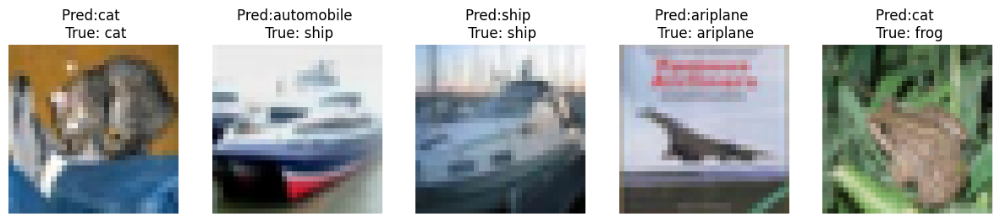

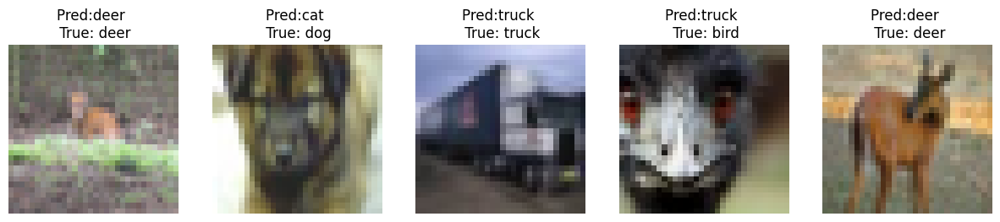

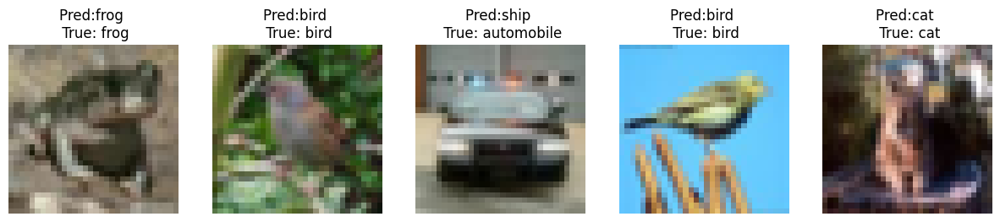

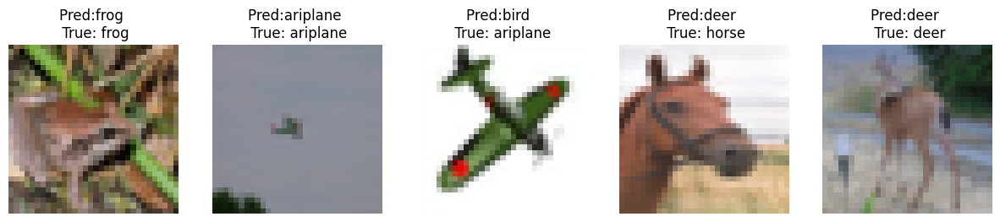

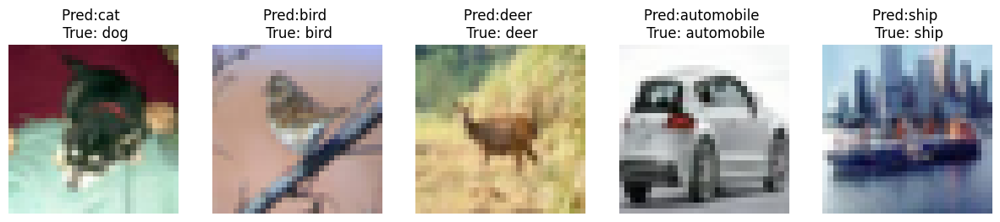

...

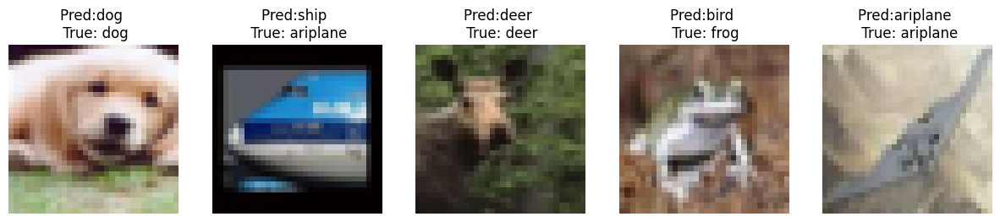

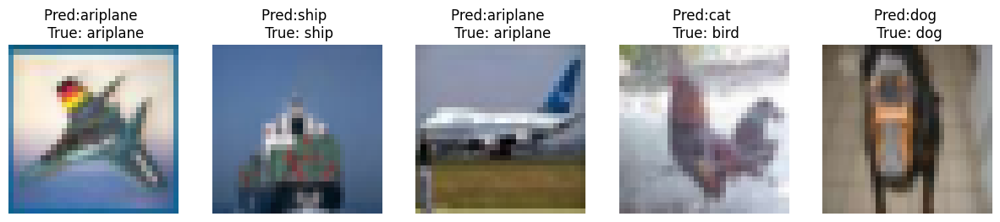

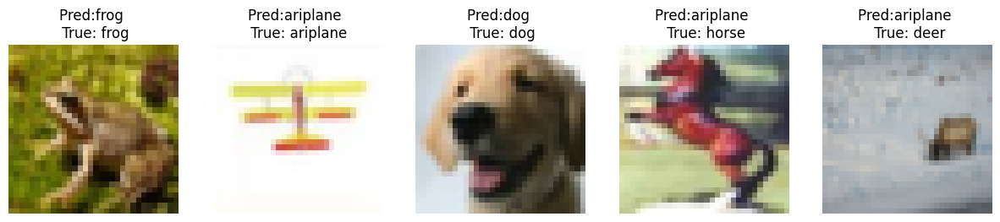

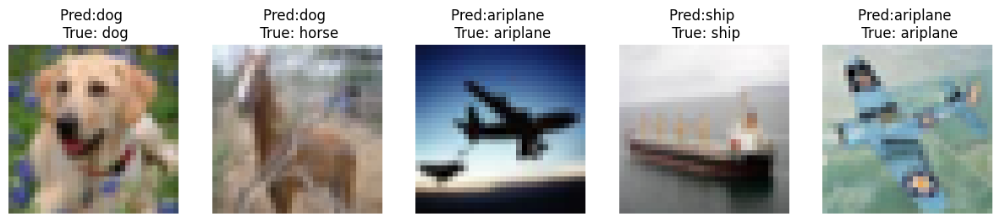

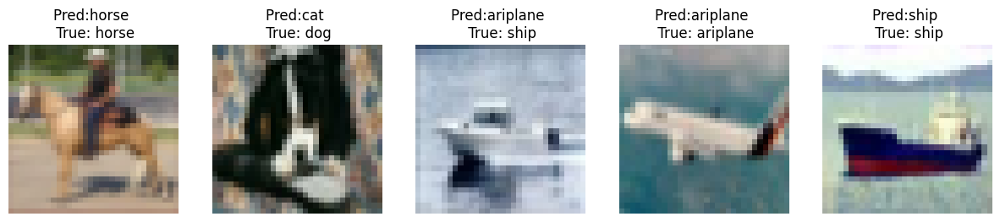

In [31]:
with torch.no_grad():
    for images, labels in testloader:
        output = model(images)
        _,prediction = torch.max(output, 1)
        plt.figure(figsize=(15,5))
        for i in range(no_of_images_to_show):
            img = images[i].numpy().transpose(1,2,0) # to convert the image back to RGB format
            img = img * 0.5 + 0.5    # to add biasness of 0.5 for flexibility
            plt.subplot(1, no_of_images_to_show, i+1)
            plt.imshow(img)
            plt.title("Pred:{} \n True: {}".format(classes[prediction[i]],classes[labels[i]]))
            plt.axis("off")
        plt.show()